# Analisis combinando LandSat y Planet Scope

Las fechas de interes son cercanas a:

20/11/2020

12/11/2021

27/11/2022


27/11/2023 (no disponible en Planet Scope)

30/12/2023




In [1]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)

In [2]:
import datacube
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import *

from odc.ui import DcViewer
from datacube.utils import masking
from datacube.utils.rio import configure_s3_access

configure_s3_access(aws_unsigned=False, requester_pays=True, client=client)

In [3]:
dc = datacube.Datacube(app='landsat-glacier-fc') 


In [4]:
#xmin:  -73.35676489704194
#ymin:  -51.274579580124886
#xmax:  -72.80813635761145
#ymax:  -50.839518983207824
xmin:  -73.387750
ymin:  -51.158668
xmax:  -73.040198
ymax:  -50.838058

In [5]:
from dea_tools.plotting import display_map, rgb



In [6]:
query7 = {
    "product": "landsat7_c2l2_sr",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}

query7st = {
    "product": "landsat7_c2l2_st",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}


query8 = {
    "product": "landsat8_c2l2_sr",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}


query9 = {
    "product": "landsat9_c2l2_sr",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"  
}


querySRTM = {
    "product": "srtm",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}


querySAF = {
    "product": "ultracam_saf",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}

In [7]:
display_map(x = query8['x'], y = query8['y'])

In [7]:
ds8 = dc.load(**query8)

ds8

<xarray.Dataset>
Dimensions:      (time: 369, y: 1684, x: 1371)
Coordinates:
  * time         (time) datetime64[ns] 2013-03-30T14:18:47.272840 ... 2024-03...
  * y            (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x            (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    blue         (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red          (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_pixel     (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_aerosol   (time, y, x) uint8 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_radsat    (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

In [8]:
good_pixel_flags = {
    "cloud": "not_high_confidence",
    "cloud_shadow": "not_high_confidence",
    "nodata": False
}

In [9]:
bandas_reflectancia = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]

In [10]:
quality_band = 'qa_pixel'
cloud_free_mask1 = masking.make_mask(ds8[quality_band], **good_pixel_flags)
dsf = ds8[bandas_reflectancia].where(cloud_free_mask1)

/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


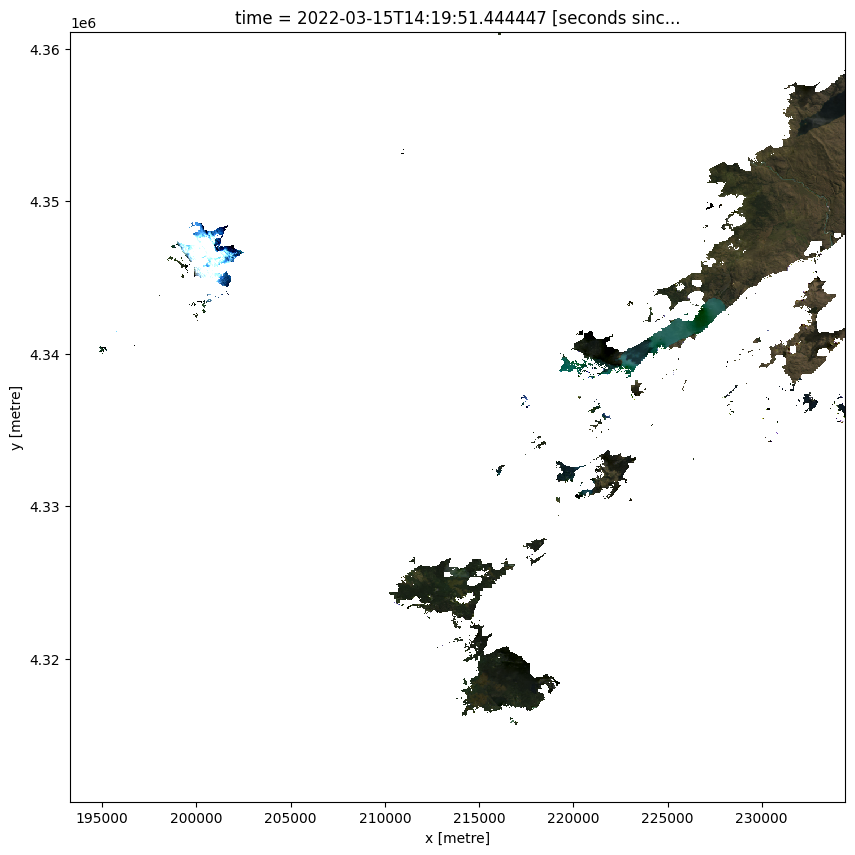

In [11]:
dsf[["red", "green", "blue"]].isel(time=300).to_array().plot.imshow(robust=True, figsize=(10, 10))

In [12]:
valid_pixel_proportion = cloud_free_mask1.sum(dim=("x", "y"))/(cloud_free_mask1.shape[1] * cloud_free_mask1.shape[2])

valid_threshold = 0.6

observations_to_keep = (valid_pixel_proportion >= valid_threshold)
ds_keep = dsf.sel(time=observations_to_keep).persist()

ds_keep.update(ds_keep * 0.0000275 + -0.2)

ds_keep

/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(
/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


<xarray.Dataset>
Dimensions:      (time: 67, y: 1684, x: 1371)
Coordinates:
  * time         (time) datetime64[ns] 2013-04-23T14:21:42.088233 ... 2024-03...
  * y            (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x            (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red          (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08        (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16       (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22       (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

In [13]:
no_cloud_date = ds_keep.time.values

In [14]:
no_cloud_date

array(['2013-04-23T14:21:42.088233000', '2013-08-29T14:21:58.592845000',
       '2013-10-16T14:21:46.753907000', '2013-12-19T14:21:23.359164000',
       '2014-08-07T14:26:08.063630000', '2014-09-24T14:26:11.018376000',
       '2015-01-23T14:19:52.192663000', '2015-04-13T14:19:18.531071000',
       '2015-08-19T14:19:40.420639000', '2015-09-20T14:19:53.910384000',
       '2015-10-06T14:19:56.828947000', '2016-01-10T14:19:59.858888000',
       '2016-02-02T14:26:09.116608000', '2016-03-21T14:25:52.736941000',
       '2016-04-22T14:25:37.887028000', '2016-05-01T14:19:32.547514000',
       '2016-09-29T14:26:20.048965000', '2017-02-04T14:26:07.037636000',
       '2017-03-17T14:19:37.388610000', '2017-05-04T14:19:13.367978000',
       '2017-10-11T14:20:12.524614000', '2018-03-20T14:19:27.477682000',
       '2018-03-27T14:25:35.414682000', '2018-12-24T14:25:59.115253000',
       '2019-01-09T14:25:57.786927000', '2019-02-03T14:19:41.591005000',
       '2019-02-26T14:25:48.160579000', '2019-03-14

In [15]:
fechas_interes = ['2023-12-30', '2022-11-27', '2021-11-12', '2020-11-20']
#meses_interes = ['2023-12', '2023-11', '2022-11', '2021-11', '2020-11'] # agregado '2023-11'
meses_interes = ['2023-11', '2023-12', '2024-01', 
                 '2023-10', '2023-11','2023-12',
                 '2022-10', '2022-11','2022-12', 
                 '2021-10', '2021-11','2021-12', 
                 '2020-10', '2020-11','2020-12'] # agregado '2023-11' y mes anterior y posterior

In [16]:

landsat_interest_dates = []

for date in no_cloud_date:
    date_formated = "-".join(np.datetime_as_string(date).split("T")[0].split("-")[:2])
    #print(date_formated)
    if (date_formated in meses_interes):
        print(date)
        landsat_interest_dates.append(date)
        
        

2020-10-26T14:26:26.200413000
2020-11-20T14:20:14.462163000
2020-12-29T14:26:24.122766000
2021-11-30T14:26:28.204965000
2021-12-09T14:20:17.129344000
2021-12-25T14:20:13.082127000
2022-10-16T14:26:38.261214000
2022-11-26T14:20:29.084862000
2022-12-19T14:26:31.872427000
2023-10-19T14:26:14.589856000
2023-12-06T14:26:11.679446000


In [17]:
landsat_interest_dates

[numpy.datetime64('2020-10-26T14:26:26.200413000'),
 numpy.datetime64('2020-11-20T14:20:14.462163000'),
 numpy.datetime64('2020-12-29T14:26:24.122766000'),
 numpy.datetime64('2021-11-30T14:26:28.204965000'),
 numpy.datetime64('2021-12-09T14:20:17.129344000'),
 numpy.datetime64('2021-12-25T14:20:13.082127000'),
 numpy.datetime64('2022-10-16T14:26:38.261214000'),
 numpy.datetime64('2022-11-26T14:20:29.084862000'),
 numpy.datetime64('2022-12-19T14:26:31.872427000'),
 numpy.datetime64('2023-10-19T14:26:14.589856000'),
 numpy.datetime64('2023-12-06T14:26:11.679446000')]

/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


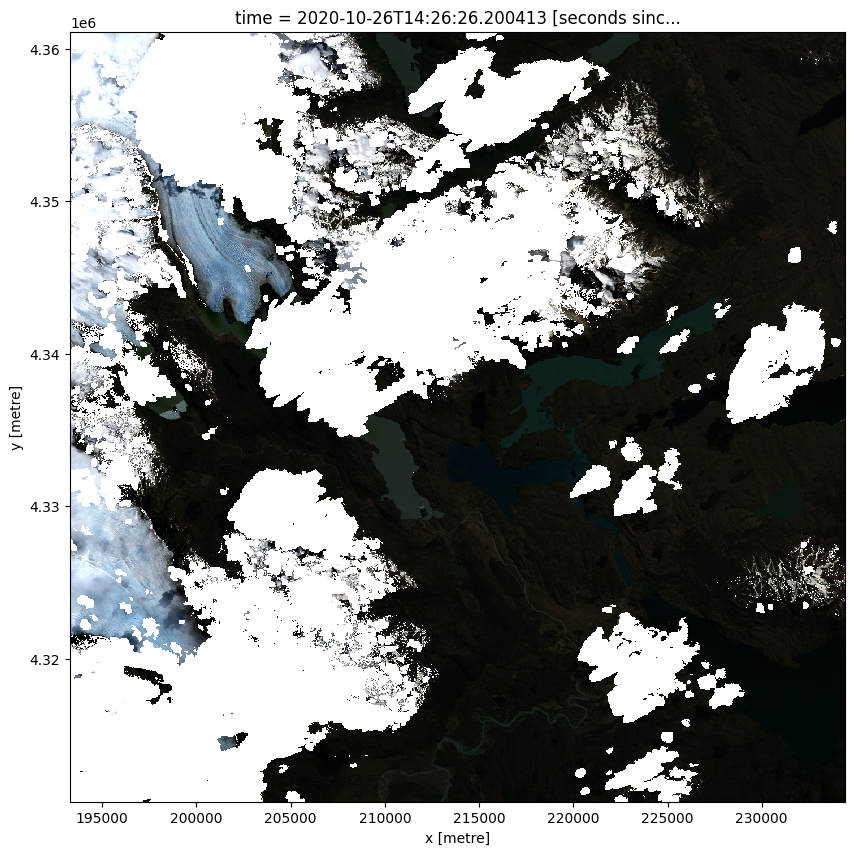

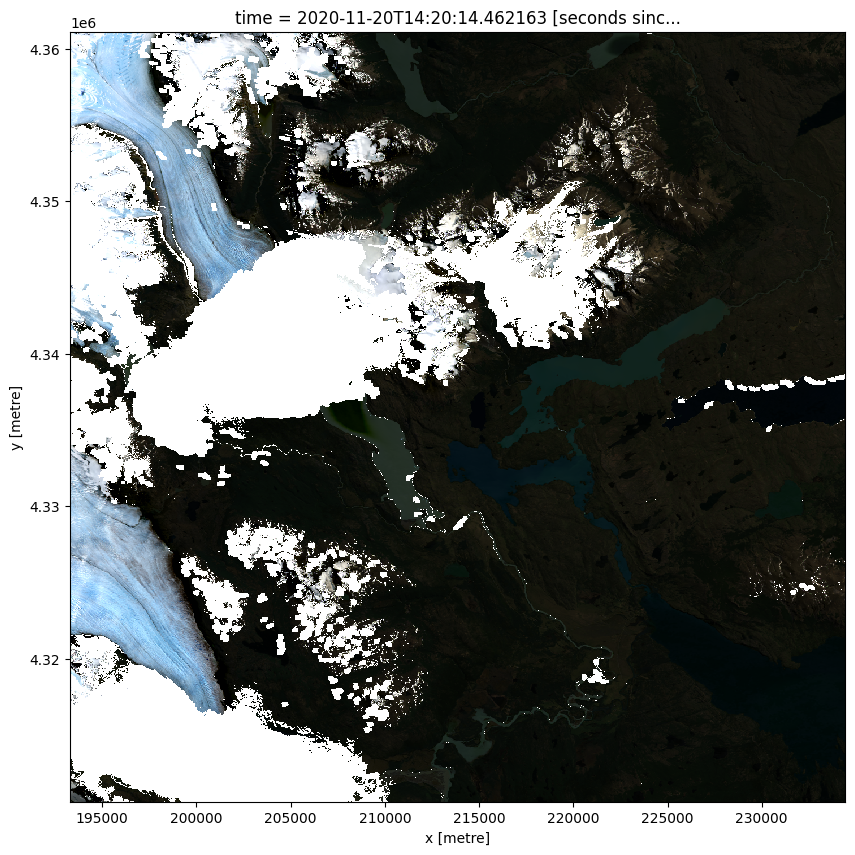

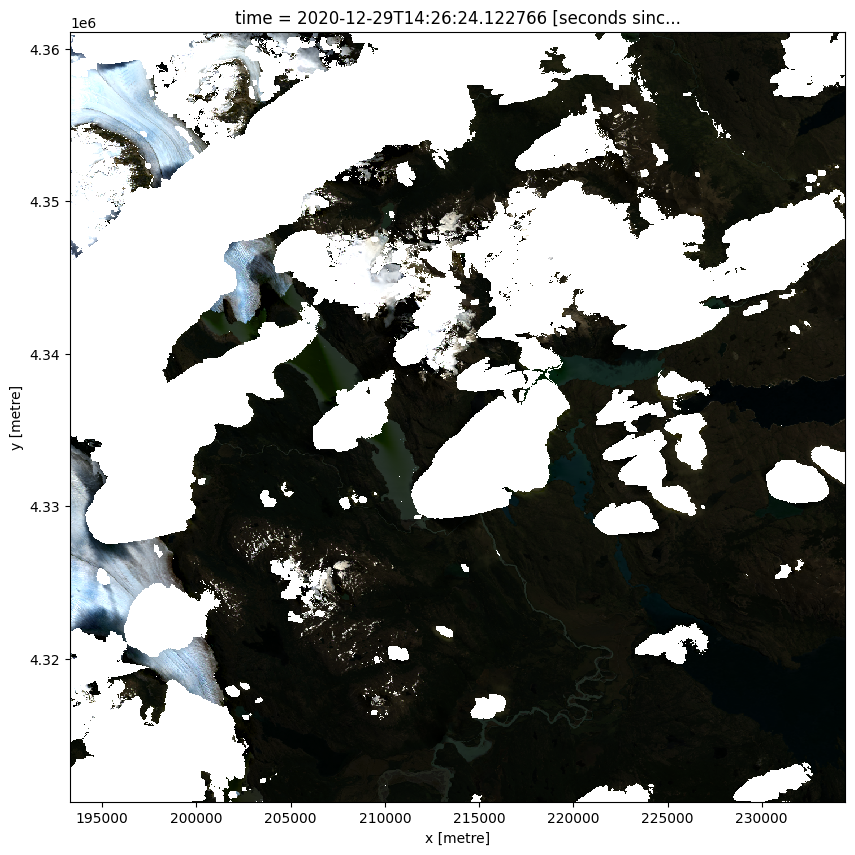

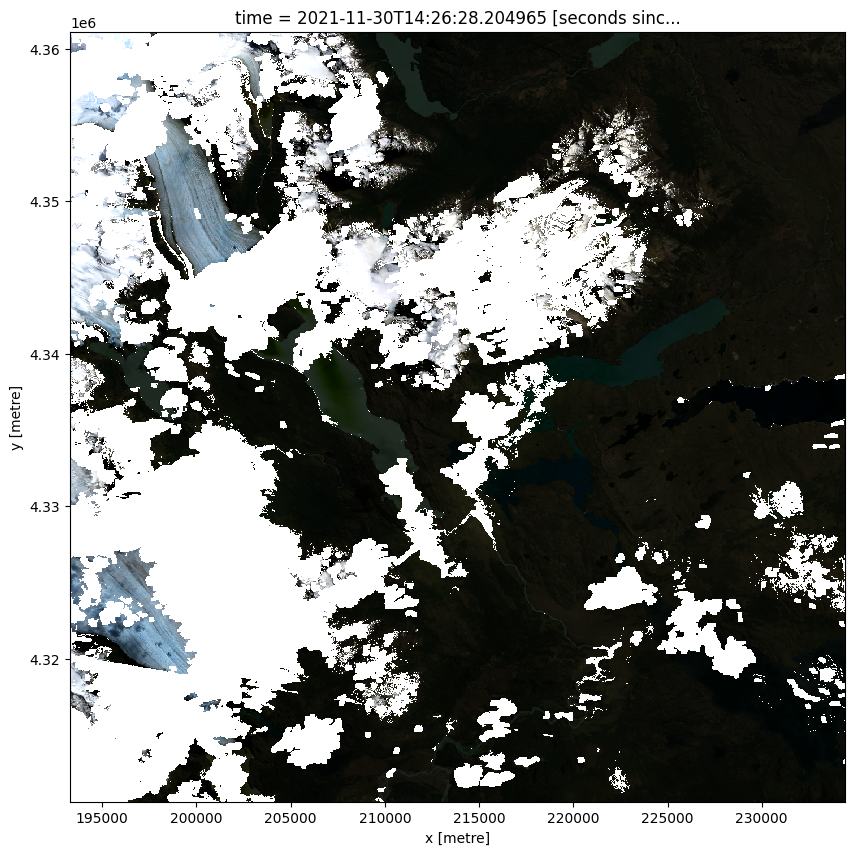

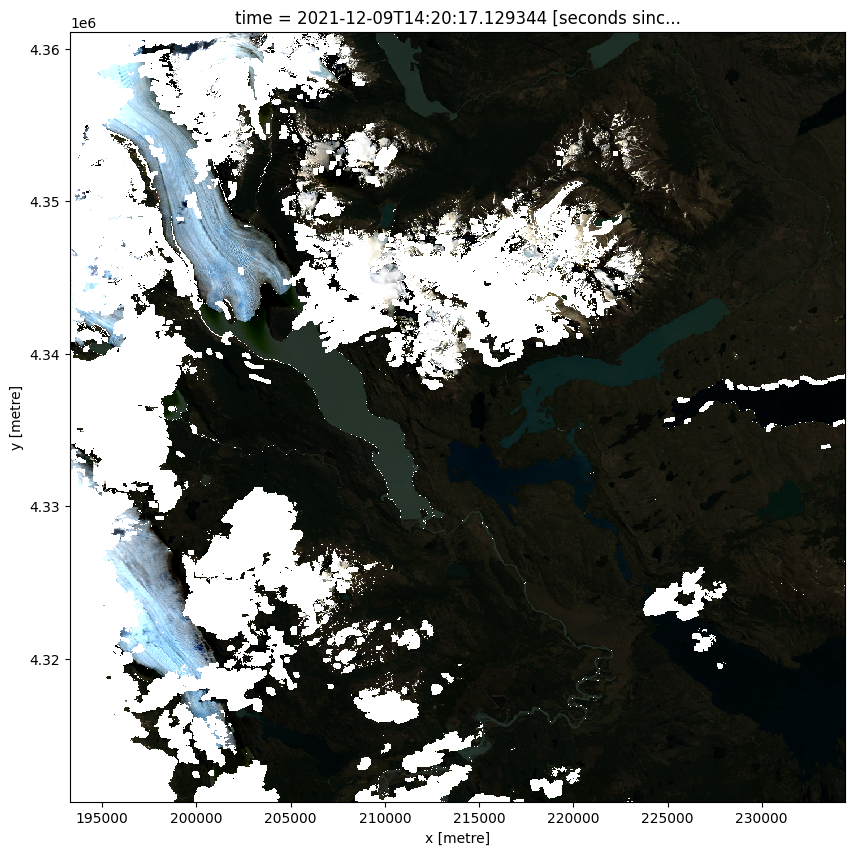

...

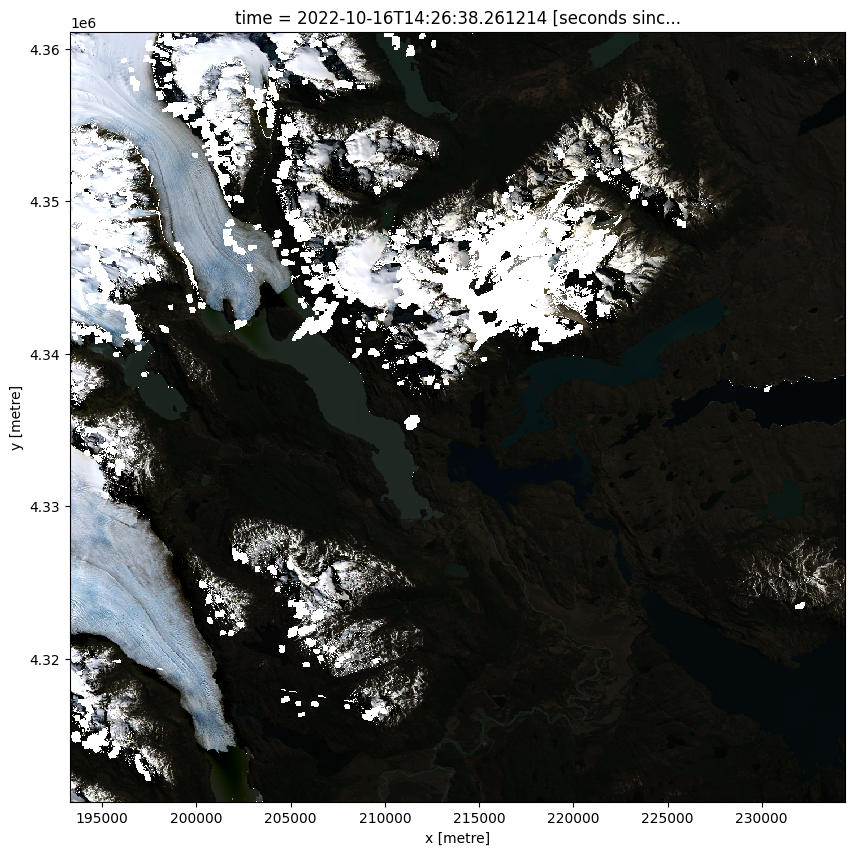

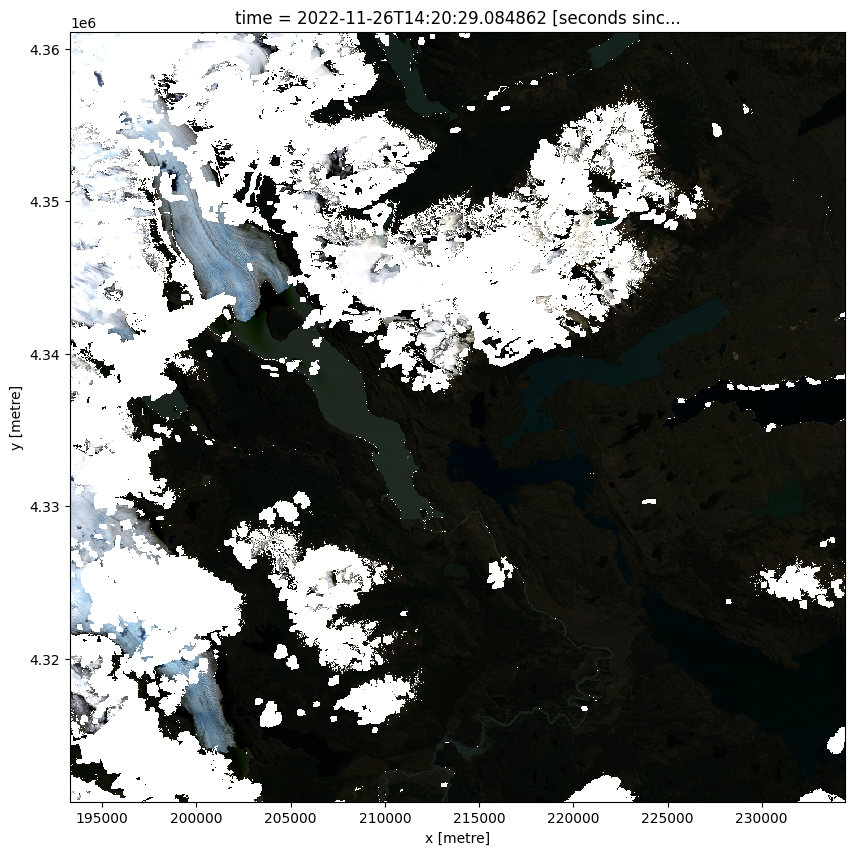

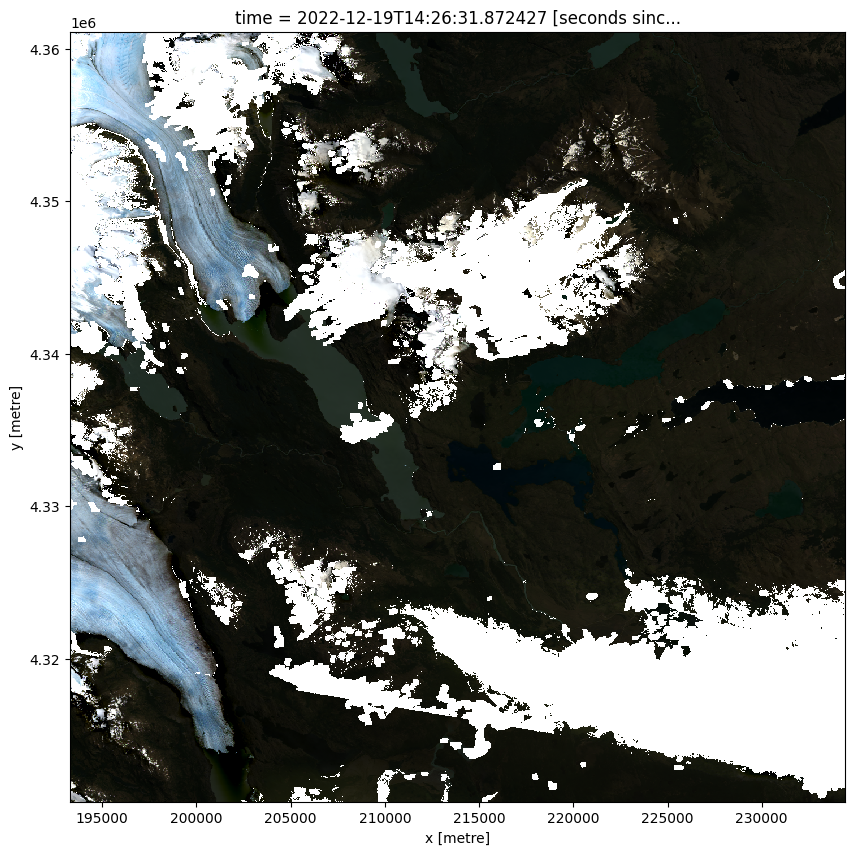

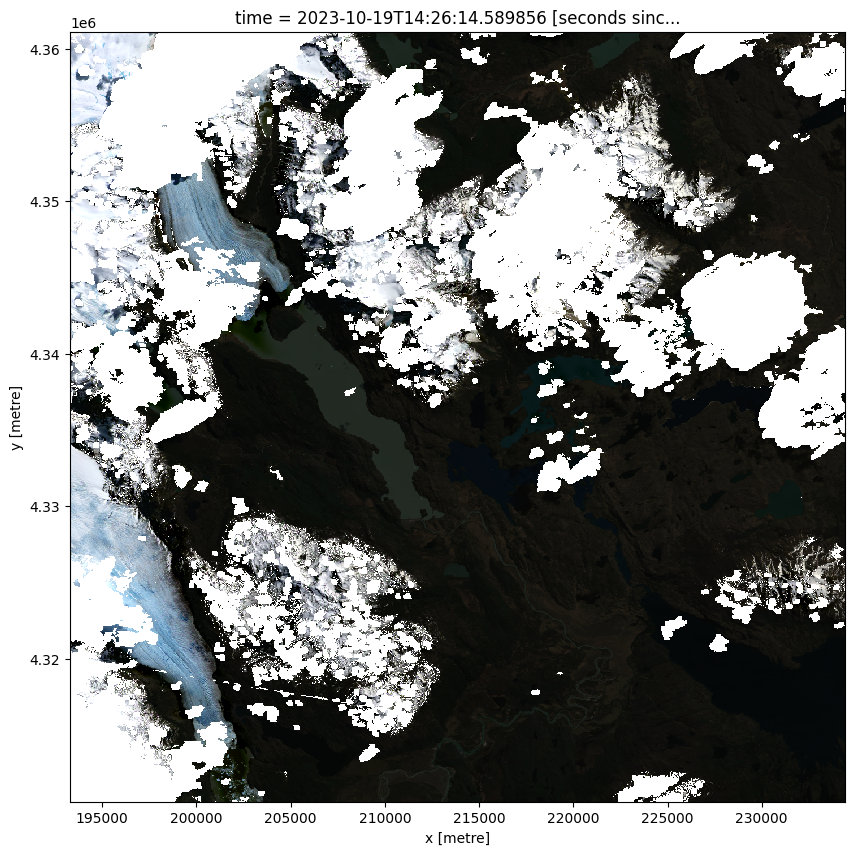

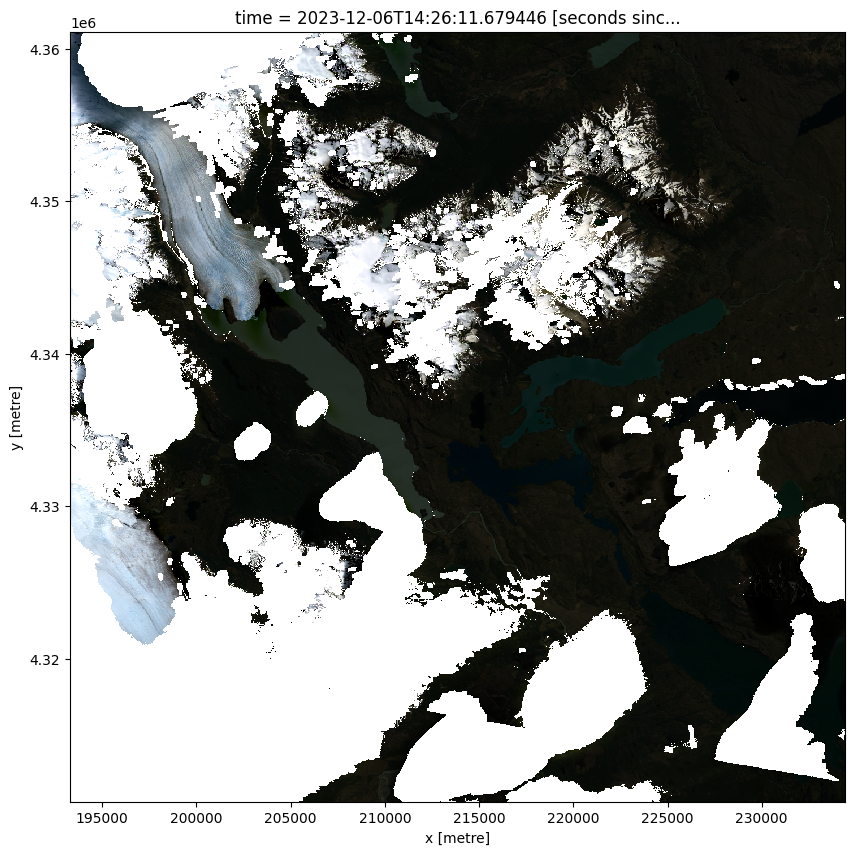

In [18]:
for date in landsat_interest_dates:
    ds_keep[["red", "green", "blue"]].sel(time = date).to_array().plot.imshow(robust=True, figsize=(10, 10))

### Something

In [19]:
good_snow_pixel_flags = {
    "snow_ice_confidence": "high",
    "nodata": False,
}
quality_band = 'qa_pixel'


In [20]:
snow_mask = masking.make_mask(ds8[quality_band], **good_snow_pixel_flags)


In [21]:
manually_selected = ['2021-12-09T14:20:17.129344000', '2022-10-16T14:26:38.261214000', '2023-12-06T14:26:11.679446000']

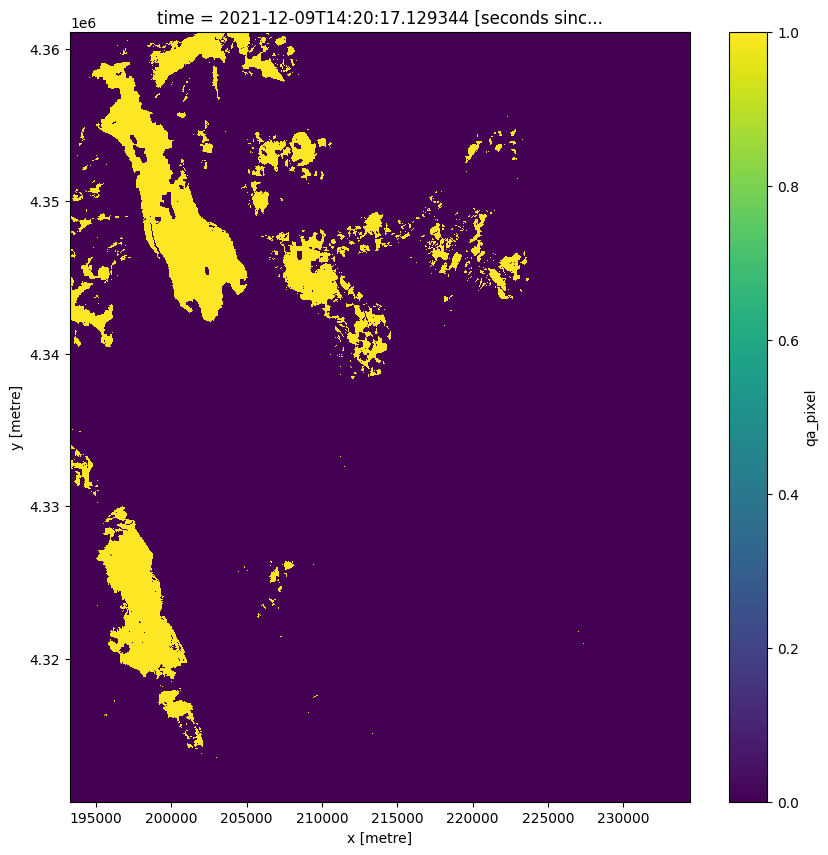

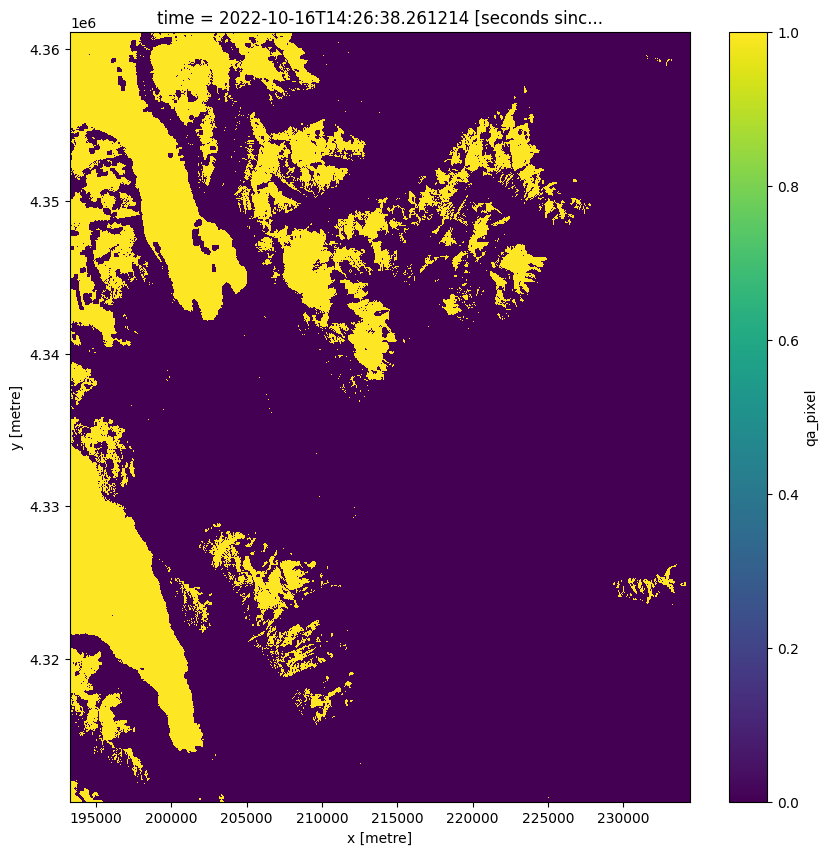

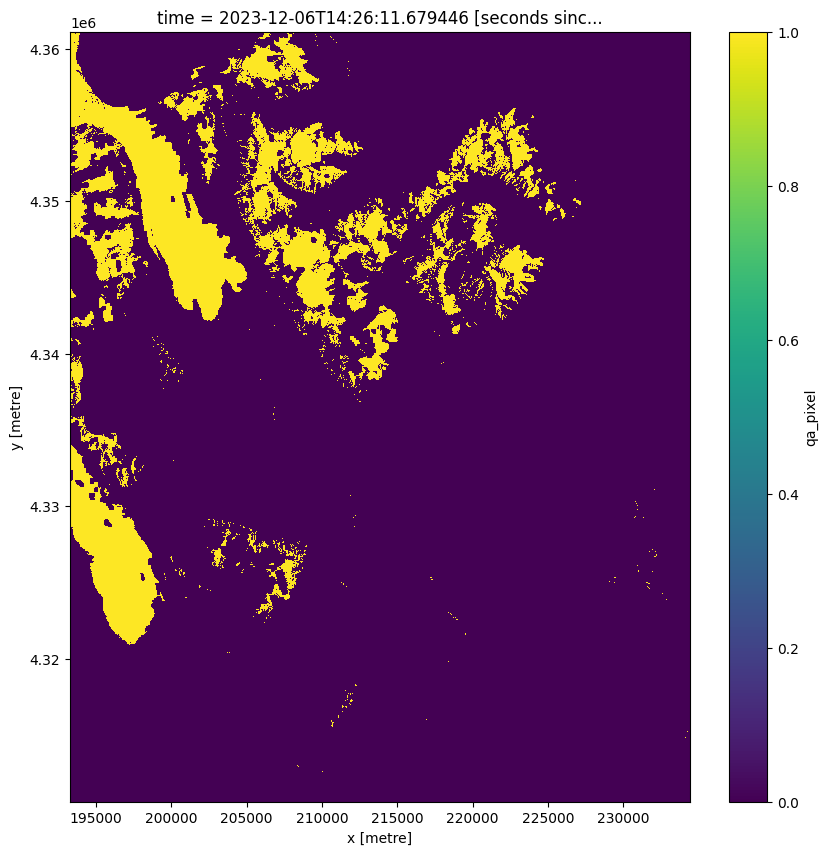

In [22]:
for date in manually_selected:
    snow_mask.sel(time=date).plot.imshow(figsize=(10,10))